# 🐟 Fish Species Classification — LightGBM Complete Pipeline
### IoT-ML Aquaculture Monitoring | 14 Species | 10 Ponds | 4 Water Types
---
**Pipeline summary:** EDA (20 methods) → Preprocessing (5) → LightGBM Training (12) → Evaluation → 6 CSVs + 5 PKLs + 15 HD PNGs @ 300 DPI

In [1]:
# ============================================================
# CELL 1 — IMPORTS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import os
import warnings
import joblib

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_curve, auc, precision_recall_curve,
    precision_score, recall_score, f1_score
)
from imblearn.over_sampling import SMOTE
import lightgbm as lgb

warnings.filterwarnings('ignore')

# ── Global plot settings ── 300 DPI
DPI = 300
matplotlib.rcParams['figure.dpi']    = DPI
matplotlib.rcParams['savefig.dpi']   = DPI
matplotlib.rcParams['font.size']     = 11
matplotlib.rcParams['axes.titlesize']= 14
matplotlib.rcParams['axes.labelsize']= 12
sns.set_style("whitegrid")
sns.set_context("notebook", font_scale=1.1)

print("✅ CELL 1 DONE: All libraries imported")
print(f"   📌 DPI set globally → {DPI}")
print("   📌 LightGBM | SMOTE | sklearn | seaborn — ALL READY")

✅ CELL 1 DONE: All libraries imported
   📌 DPI set globally → 300
   📌 LightGBM | SMOTE | sklearn | seaborn — ALL READY


In [ ]:
# ============================================================
# CELL 2 — LOAD DATASET
# ============================================================
df = pd.read_csv("-----------------------------------")

print("✅ CELL 2 DONE: Dataset loaded")
print(f"📊 Shape   : {df.shape}")
print(f"📋 Columns : {df.columns.tolist()}")

✅ CELL 2 DONE: Dataset loaded
📊 Shape   : (100000, 12)
📋 Columns : ['Pond_ID', 'Water_Type', 'pH', 'Temperature', 'Turbidity', 'Ultrasonic', 'TDS', 'Red', 'Green', 'Blue', 'Clear', 'Fish_Species']


In [3]:
# ============================================================
# CELL 3 — DATASET OVERVIEW  [EDA functions 1–8]
# ============================================================
print("=" * 65)
print("📌 DATASET OVERVIEW")
print("=" * 65)

# EDA method 1 — df.shape
print(f"\n🔢 Total Rows    : {len(df):,}")
print(f"🔢 Total Columns : {df.shape[1]}")

# EDA method 2 — df.dtypes
print("\n📋 Data Types:\n", df.dtypes)

# EDA method 3 — df.head()
print("\n🔍 First 5 Rows:\n", df.head())

# EDA method 4 — df.describe()
print("\n📊 Basic Statistics:\n", df.describe())

# EDA method 5 — df.isnull().sum()
print("\n❓ Missing Values:\n", df.isnull().sum())

# EDA method 6 — df['col'].value_counts()
print("\n🐟 Fish Species (14 types):\n", df['Fish_Species'].value_counts())
print("\n💧 Water Types  (4 types):\n",  df['Water_Type'].value_counts())

# EDA method 7 — df['col'].unique() + method 8 — sorted()
print("\n🏊 Pond IDs:", sorted(df['Pond_ID'].unique().tolist()))

print("\n✅ CELL 3 DONE: Dataset Overview Complete")

📌 DATASET OVERVIEW

🔢 Total Rows    : 100,000
🔢 Total Columns : 12

📋 Data Types:
 Pond_ID           int64
Water_Type       object
pH              float64
Temperature     float64
Turbidity       float64
Ultrasonic      float64
TDS             float64
Red               int64
Green             int64
Blue              int64
Clear             int64
Fish_Species     object
dtype: object

🔍 First 5 Rows:
    Pond_ID      Water_Type    pH  Temperature  Turbidity  Ultrasonic     TDS  \
0        1           Muddy  7.12        26.35       8.07        2.33  223.28   
1        7  Algae-affected  8.37        29.62       4.53        1.43  301.22   
2        8           Muddy  7.21        26.21      13.51        1.99  208.26   
3       10    Contaminated  6.94        24.72       4.09        1.21  426.64   
4        8           Muddy  7.00        26.26      10.97        2.08  341.77   

     Red  Green   Blue  Clear Fish_Species  
0  55586  44152  34286  29481       Tengra  
1  35248  55472  43934  40

In [ ]:
# ============================================================
# CELL 4 — FEATURE ENGINEERING
# ============================================================
base_num_cols = ['---------------', '---------', '------', '-----', '-------',
                 '----', '----', '----', '-----']

# 1. Color Ratios
df['Red_Green_Ratio']      = df['Red']   / (df['Green'] + 1)
df['Blue_Clear_Ratio']     = df['Blue']  / (df['Clear'] + 1)
df['Green_Blue_Ratio']     = df['Green'] / (df['Blue']  + 1)
df['Red_Blue_Ratio']       = df['Red']   / (df['Blue']  + 1)
df['Clear_Total_Ratio']    = df['Clear'] / (df['Red'] + df['Green'] + df['Blue'] + 1)

# 2. Color Total Intensity
df['RGB_Total']            = df['']  + df['Green'] + df['Blue']
df['RGBC_Total']           = df['Red']  + df['Green'] + df['Blue'] + df['Clear']

# 3. Water Chemistry Interactions
df['pH_TDS']               = df['pH']          * df['']
df['pH_Turbidity']         = df['pH']          * df['Ty']
df['Temp_TDS']             = df['Temperature'] * df['']
df['Temp_Turbidity']       = df['Temperature'] * df['Ty']
df['Turbidity_TDS']        = df['Turbidity']   * df['']
df['Ultrasonic_Turbidity'] = df['Ultrasonic']  * df['']

# 4. Normalized Features
df['pH_norm']   = (df['pH']          - df['pH'].min())          / (df['pH'].max()          - df['pH'].min())
df['Temp_norm'] = (df['Temperature'] - df['Temperature'].min()) / (df['Temperature'].max() - df['Temperature'].min())
df['TDS_norm']  = (df['TDS']         - df['TDS'].min())         / (df['TDS'].max()         - df['TDS'].min())

# Label Encoding — Preprocessing method 1
# method 2 fit_transform
df['water_encoded'] = label_encoder_water.fit_transform(df['Water_Type'])

engineered_cols = [
    '---------------------------------------------------------------------
    -----------------------
    ---------------------------------------------------------'
]

feature_columns = base_num_cols + engineered_cols + ['water_encoded', 'Pond_ID']
X = df[feature_columns]
y = df['fish_encoded']

print("✅ CELL 4 DONE: Feature Engineering Complete")
print(f"   📌 Original features  : {len(base_num_cols)}")
print(f"   📌 Engineered features: {len(engineered_cols)}")
print(f"   📌 Total features     : {len(feature_columns)}")
print(f"\n🐟 Fish classes  : {label_encoder_fish.classes_.tolist()}")
print(f"💧 Water classes : {label_encoder_water.classes_.tolist()}")

✅ CELL 4 DONE: Feature Engineering Complete
   📌 Original features  : 9
   📌 Engineered features: 16
   📌 Total features     : 27

🐟 Fish classes  : ['Bass', 'Bata', 'Carp', 'Catla', 'Mugur', 'Pangasius', 'Prawn', 'Rohu', 'Salmon', 'Silver Carp', 'Snapper', 'Tengra', 'Tilapia', 'Trout']
💧 Water classes : ['Algae-affected', 'Clear', 'Contaminated', 'Muddy']


In [ ]:
# ============================================================
# CELL 5 — SCALING  [Preprocessing method 3 & 4]
# ============================================================


print("✅ CELL 5 DONE: StandardScaler applied")
print(f"   📌 Scaled Shape : {X_scaled.shape}")

✅ CELL 5 DONE: StandardScaler applied
   📌 Scaled Shape : (100000, 27)


In [ ]:
# ============================================================
# CELL 6 — SMOTE  [Preprocessing method 5]
# ============================================================
print("⏳ Applying SMOTE (may take a few minutes)...")

for u, c in zip(unique, counts):
    print(f"   {label_encoder_fish.classes_[u]:20s}: {c:,}")

⏳ Applying SMOTE (may take a few minutes)...
✅ CELL 6 DONE: SMOTE Applied
   📌 Before SMOTE: 100,000 samples
   📌 After  SMOTE: 458,780 samples

📊 Class Distribution After SMOTE:
   Bass                : 32,770
   Bata                : 32,770
   Carp                : 32,770
   Catla               : 32,770
   Mugur               : 32,770
   Pangasius           : 32,770
   Prawn               : 32,770
   Rohu                : 32,770
   Salmon              : 32,770
   Silver Carp         : 32,770
   Snapper             : 32,770
   Tengra              : 32,770
   Tilapia             : 32,770
   Trout               : 32,770


In [7]:
# ============================================================
# CELL 7 — CREATE OUTPUT DIRECTORIES  [Saving method 1]
# ============================================================
os.makedirs("plots",   exist_ok=True)   # saving method 1
os.makedirs("results", exist_ok=True)
os.makedirs("models",  exist_ok=True)

print(f"✅ CELL 7 DONE: Directories created | DPI = {DPI}")
print("   📁 plots/  → all HD PNG images")
print("   📁 results/ → all CSV files")
print("   📁 models/  → all PKL files")

✅ CELL 7 DONE: Directories created | DPI = 300
   📁 plots/  → all HD PNG images
   📁 results/ → all CSV files
   📁 models/  → all PKL files


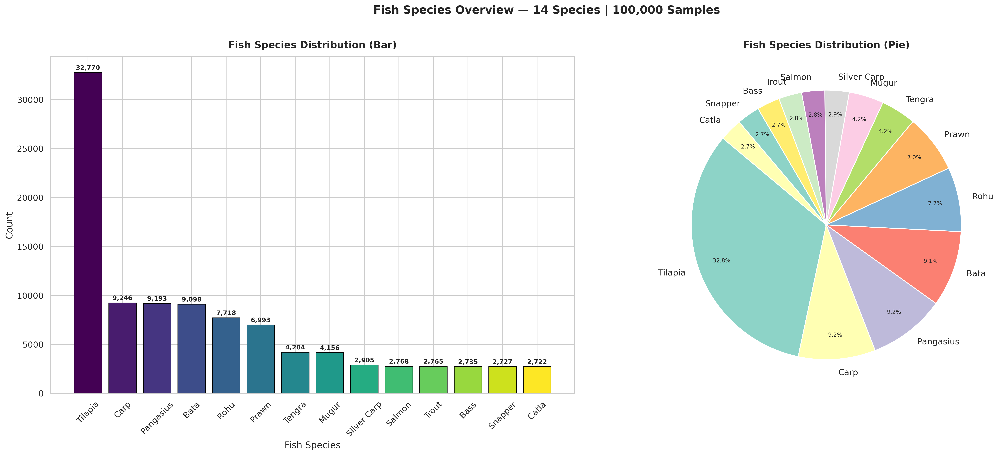

✅ CELL 8 DONE: Fish Distribution saved @ 300 DPI


In [ ]:
# ============================================================
# CELL 8 — EDA: FISH SPECIES DISTRIBUTION  [Graph 1,2,4]
# ============================================================
# EDA method 6 — value_counts()
fish_counts = df['Fish_Species'].value_counts()

fig, axes = plt.subplots(1, 2, figsize=(22, 9))   # graph method 1 subplots


plt.tight_layout()
plt.savefig("plots/01_fish_distribution.png", dpi=DPI, bbox_inches='tight')  # saving method 5
plt.show()   # graph method 15
print("✅ CELL 8 DONE: Fish Distribution saved @ 300 DPI")

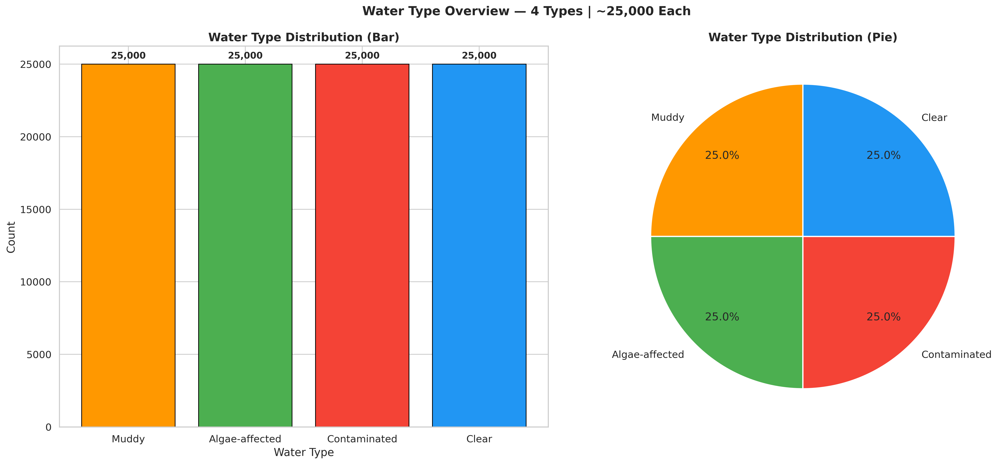

✅ CELL 9 DONE: Water Distribution saved @ 300 DPI


In [ ]:
# ============================================================
# CELL 9 — EDA: WATER TYPE DISTRIBUTION  [Graph 3,4]
# ============================================================
water_counts = df['Water_Type'].value_counts()


plt.suptitle("Water Type Overview — 4 Types | ~25,000 Each",
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("plots/02_water_distribution.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 9 DONE: Water Distribution saved @ 300 DPI")

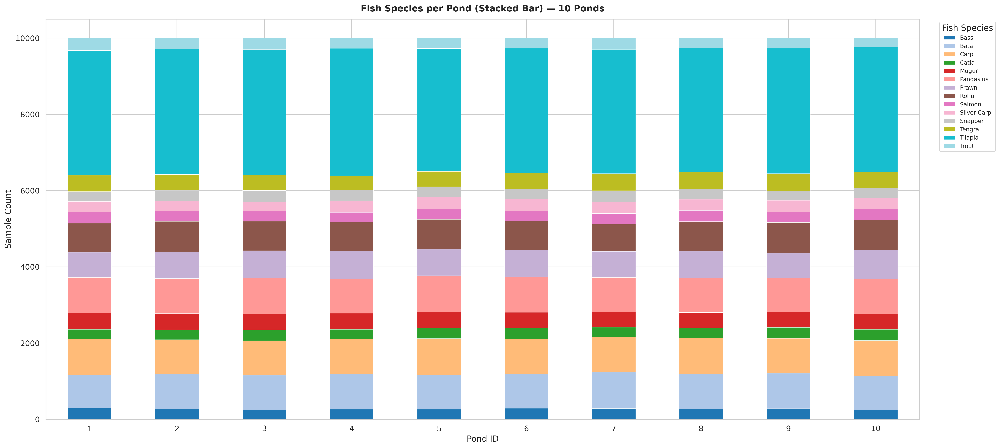

✅ CELL 10 DONE: Fish per Pond saved @ 300 DPI


In [10]:
# ============================================================
# CELL 10 — EDA: FISH PER POND STACKED BAR  [EDA 9,10,11]
# ============================================================
# EDA method 9 — groupby(), method 10 — .size(), method 11 — .unstack()
fish_pond = df.groupby(['Pond_ID', 'Fish_Species']).size().unstack(fill_value=0)

fig, ax = plt.subplots(figsize=(22, 10))
fish_pond.plot(kind='bar', stacked=True, ax=ax,
               colormap='tab20', edgecolor='white', linewidth=0.3)
ax.set_title("Fish Species per Pond (Stacked Bar) — 10 Ponds",
             fontsize=14, fontweight='bold', pad=12)
ax.set_xlabel("Pond ID"); ax.set_ylabel("Sample Count")
ax.tick_params(axis='x', rotation=0)
ax.legend(title="Fish Species",
          bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
plt.tight_layout()
plt.savefig("plots/03_fish_per_pond.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 10 DONE: Fish per Pond saved @ 300 DPI")

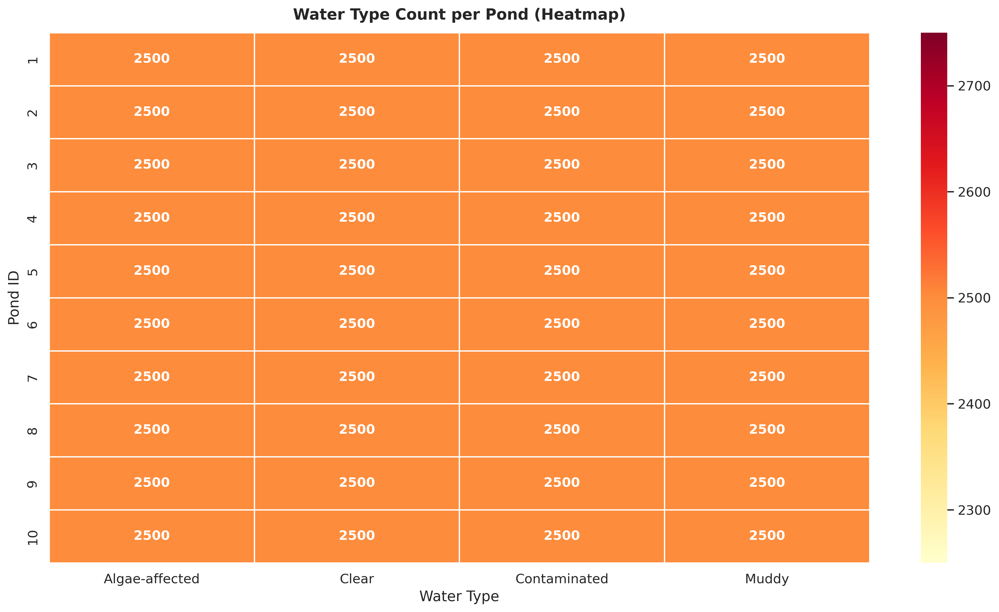

✅ CELL 11 DONE: Water-Pond Heatmap saved @ 300 DPI


In [11]:
# ============================================================
# CELL 11 — EDA: WATER TYPE PER POND HEATMAP  [Graph 5]
# ============================================================
water_pond = df.groupby(['Pond_ID', 'Water_Type']).size().unstack(fill_value=0)

plt.figure(figsize=(14, 8))   # graph method 2
# graph method 5 — sns.heatmap()
# EDA method 17 — np.triu()  [used in Cell 12]; here annot direct
sns.heatmap(water_pond, annot=True, fmt='d', cmap='YlOrRd',
            linewidths=0.8, linecolor='white',
            annot_kws={'size': 12, 'weight': 'bold'})
plt.title("Water Type Count per Pond (Heatmap)",
          fontsize=14, fontweight='bold', pad=12)
plt.xlabel("Water Type"); plt.ylabel("Pond ID")
plt.tight_layout()
plt.savefig("plots/04_water_per_pond_heatmap.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 11 DONE: Water-Pond Heatmap saved @ 300 DPI")

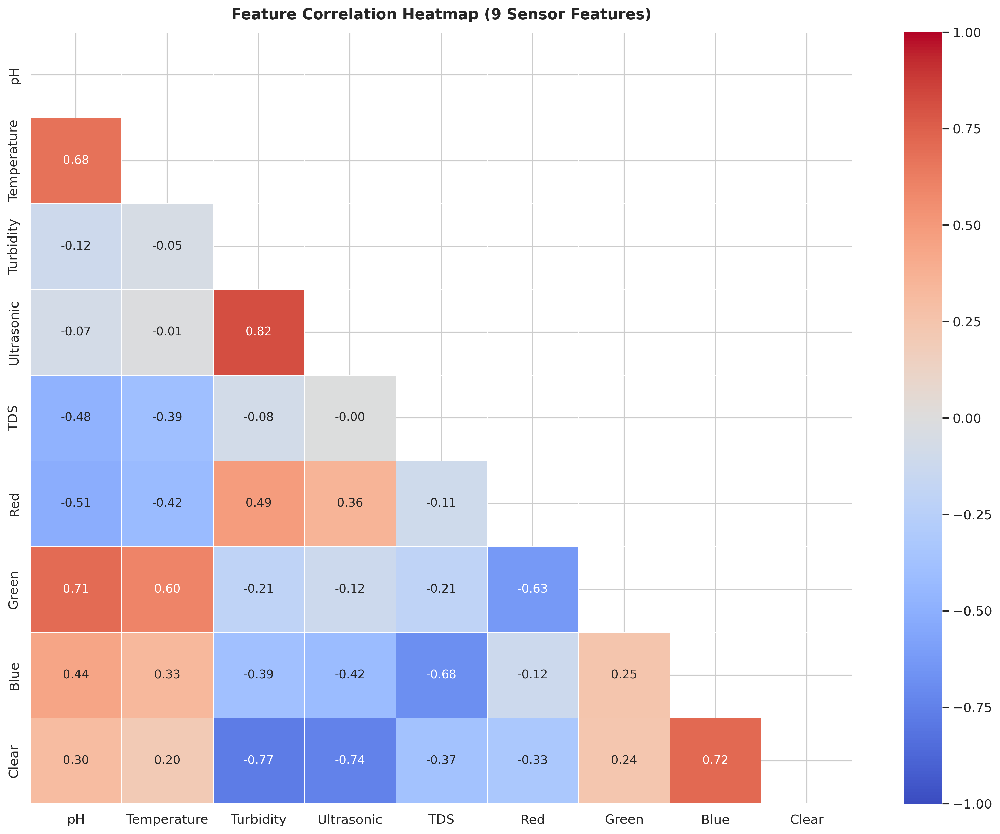

✅ CELL 12 DONE: Correlation Heatmap saved @ 300 DPI


In [12]:
# ============================================================
# CELL 12 — EDA: CORRELATION HEATMAP  [EDA 13,17,18]
# ============================================================
# EDA method 13 — .corr()
corr_matrix = df[base_num_cols].corr()

# EDA method 17 — np.triu()  |  method 18 — np.ones_like()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(14, 11))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm',
            mask=mask, linewidths=0.6, vmin=-1, vmax=1,
            annot_kws={'size': 11})
plt.title("Feature Correlation Heatmap (9 Sensor Features)",
          fontsize=14, fontweight='bold', pad=12)
plt.tight_layout()
plt.savefig("plots/05_correlation_heatmap.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 12 DONE: Correlation Heatmap saved @ 300 DPI")

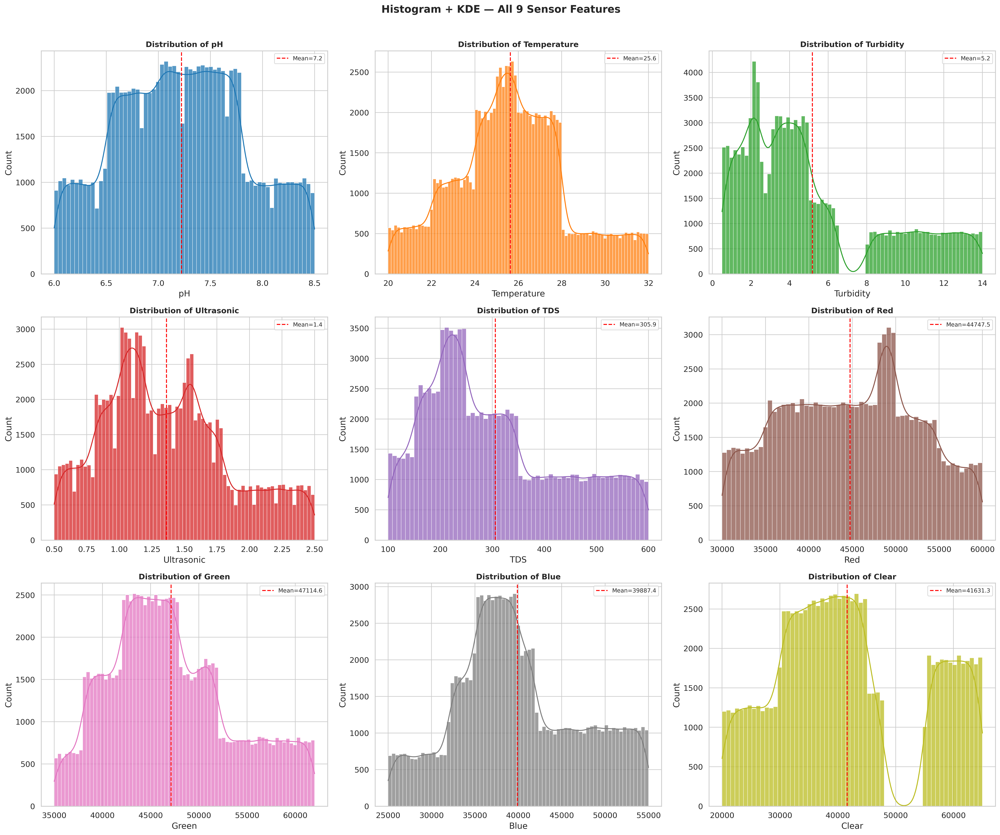

✅ CELL 13 DONE: Histogram + KDE saved @ 300 DPI


In [ ]:
# ============================================================
# CELL 13 — EDA: HISTOGRAM + KDE  [Graph 6]
# ============================================================
fig, axes = plt.subplots(3, 3, figsize=(22, 18))
axes = axes.flatten()
palette = ['#1f77b4','#ff7f0e','#2ca02c','#d62728','#9467bd',
           '#8c564b','#e377c2','#7f7f7f','#bcbd22']



plt.suptitle("Histogram + KDE — All 9 Sensor Features",
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("plots/06_histogram_kde_all.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 13 DONE: Histogram + KDE saved @ 300 DPI")

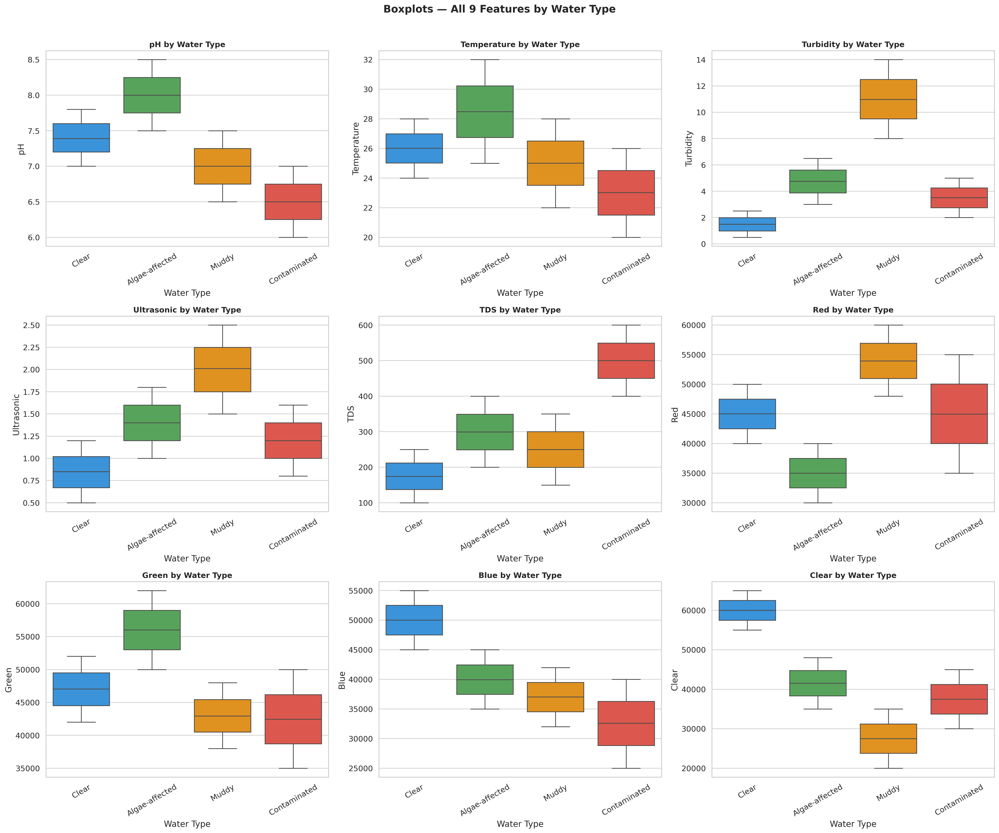

✅ CELL 14 DONE: Boxplots by Water Type saved @ 300 DPI


In [ ]:
# ============================================================
# CELL 14 — EDA: BOXPLOTS BY WATER TYPE  [Graph 7]
# ============================================================


fig, axes = plt.subplots(3, 3, figsize=(22, 18))
axes = axes.flatten()

for i, col in enumerate(base_num_cols):
    ax = axes[i]
    

plt.suptitle("Boxplots — All 9 Features by Water Type",
             fontsize=16, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig("plots/07_boxplot_by_water.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 14 DONE: Boxplots by Water Type saved @ 300 DPI")

In [ ]:
# ============================================================
# CELL 15 — EDA: VIOLIN PLOTS BY FISH SPECIES  [Graph 8]
# ============================================================
# EDA method 15 — .median()  |  method 16 — .sort_values()
for col in ['pH', 'Temperature', 'Turbidity', 'TDS']:
    
    plt.xticks(rotation=40)
    plt.tight_layout()
    plt.savefig(f"plots/08_violin_{col}_by_fish.png", dpi=DPI, bbox_inches='tight')
    plt.close()

print("✅ CELL 15 DONE: 4 Violin Plots saved @ 300 DPI")

✅ CELL 15 DONE: 4 Violin Plots saved @ 300 DPI


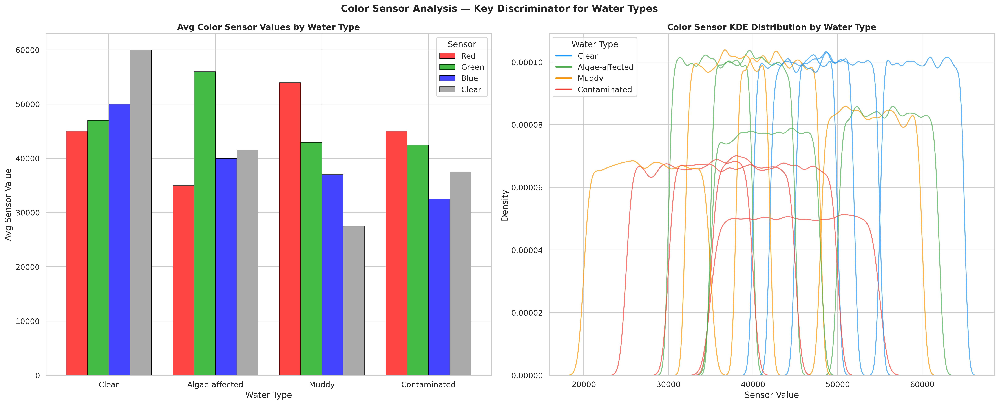

✅ CELL 16 DONE: Color Sensor Analysis saved @ 300 DPI


In [ ]:
# ============================================================
# CELL 16 — EDA: COLOR SENSOR ANALYSIS  [Graph 9,12]
# ============================================================
color_cols = ['Red', 'Green', 'Blue', 'Clear']
color_by_water = (
    df.groupby('Water_Type')[color_cols]




plt.suptitle("Color Sensor Analysis — Key Discriminator for Water Types",
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("plots/09_color_sensor_analysis.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 16 DONE: Color Sensor Analysis saved @ 300 DPI")

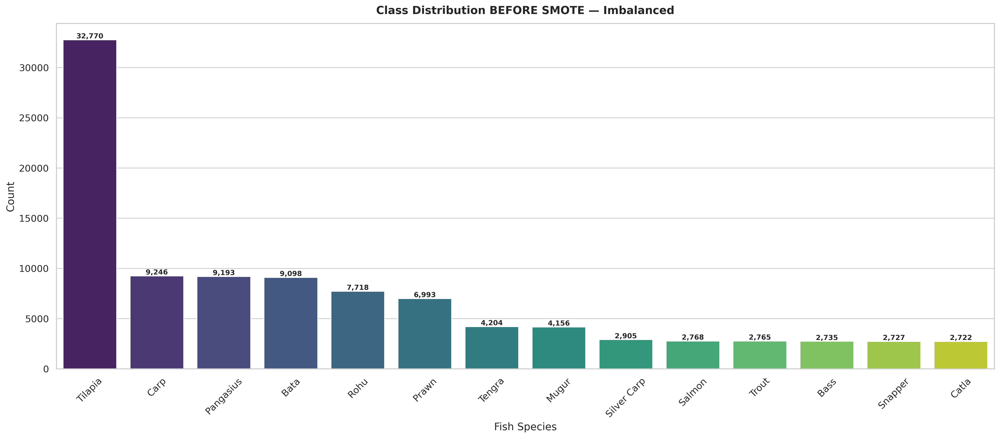

✅ CELL 17 DONE: Class Distribution Before SMOTE saved @ 300 DPI


In [ ]:
# ============================================================
# CELL 17 — EDA: CLASS DISTRIBUTION BEFORE SMOTE  [Graph 11]
# ============================================================

plt.xlabel("Fish Species"); plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("plots/10_class_dist_before_smote.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 17 DONE: Class Distribution Before SMOTE saved @ 300 DPI")

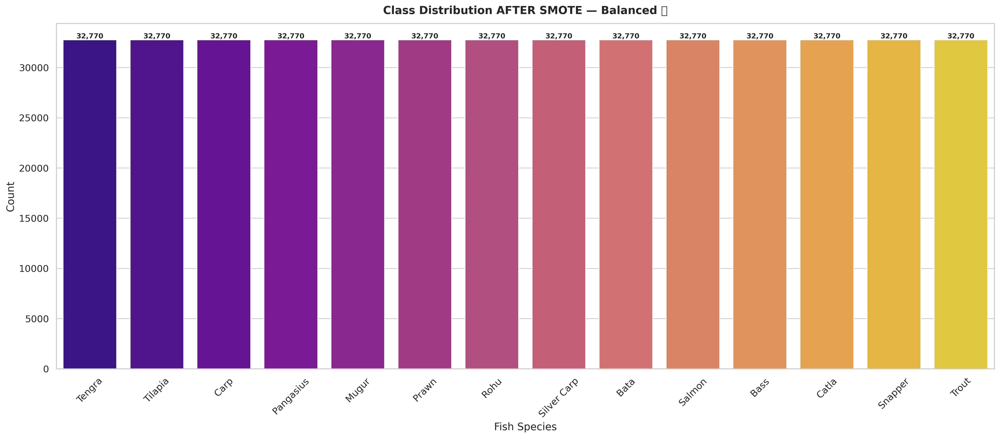

✅ CELL 18 DONE: Class Distribution After SMOTE saved @ 300 DPI


In [18]:
# ============================================================
# CELL 18 — EDA: CLASS DISTRIBUTION AFTER SMOTE  [Graph 11]
# ============================================================
plt.figure(figsize=(18, 8))
fish_smote_counts = X_res_df['Fish_Species'].value_counts()
ax = sns.countplot(x='Fish_Species', data=X_res_df,
                   order=fish_smote_counts.index, palette='plasma')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height()):,}',
                (p.get_x() + p.get_width()/2, p.get_height()),
                ha='center', va='bottom', fontsize=9, fontweight='bold')
plt.title("Class Distribution AFTER SMOTE — Balanced ✅",
          fontsize=14, fontweight='bold', pad=12)
plt.xlabel("Fish Species"); plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("plots/11_class_dist_after_smote.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 18 DONE: Class Distribution After SMOTE saved @ 300 DPI")

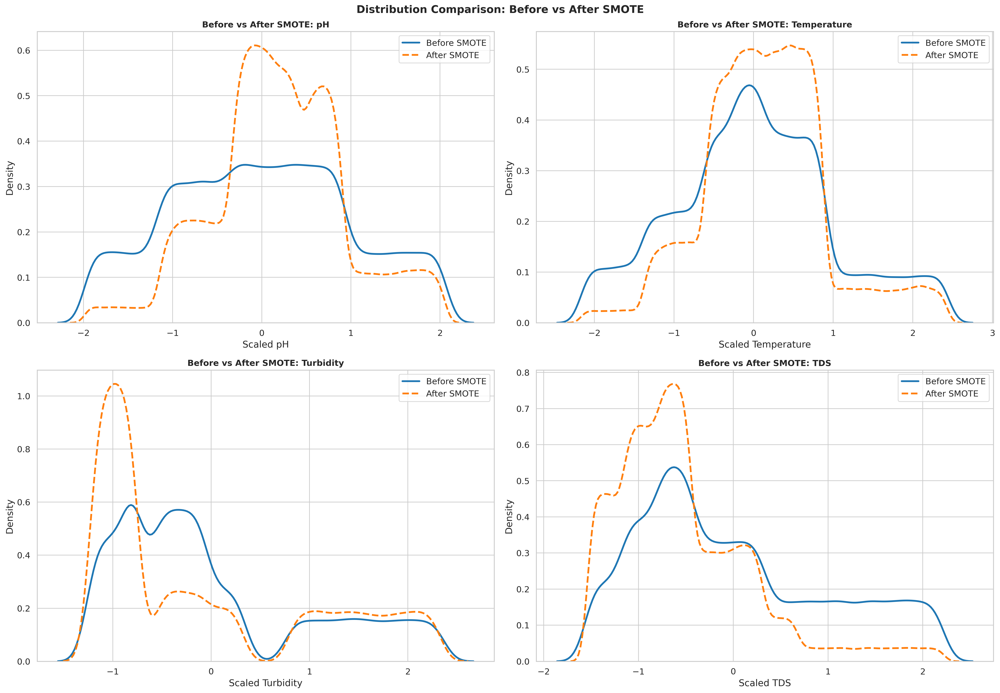

✅ CELL 19 DONE: SMOTE Comparison saved @ 300 DPI


In [19]:
# ============================================================
# CELL 19 — EDA: SMOTE BEFORE vs AFTER KDE  [Graph 9]
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(20, 14))
axes = axes.flatten()
compare_cols = ['pH', 'Temperature', 'Turbidity', 'TDS']

for i, col in enumerate(compare_cols):
    sns.kdeplot(X_scaled_df[col], ax=axes[i], label='Before SMOTE',
                color='#1f77b4', linewidth=2.5)
    sns.kdeplot(X_res_df[col],    ax=axes[i], label='After SMOTE',
                color='#ff7f0e',  linewidth=2.5, linestyle='--')
    axes[i].set_title(f"Before vs After SMOTE: {col}",
                      fontsize=12, fontweight='bold')
    axes[i].set_xlabel(f"Scaled {col}"); axes[i].set_ylabel("Density")
    axes[i].legend()

plt.suptitle("Distribution Comparison: Before vs After SMOTE",
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("plots/12_smote_comparison.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 19 DONE: SMOTE Comparison saved @ 300 DPI")

⏳ Generating Pairplot (n=3000)...


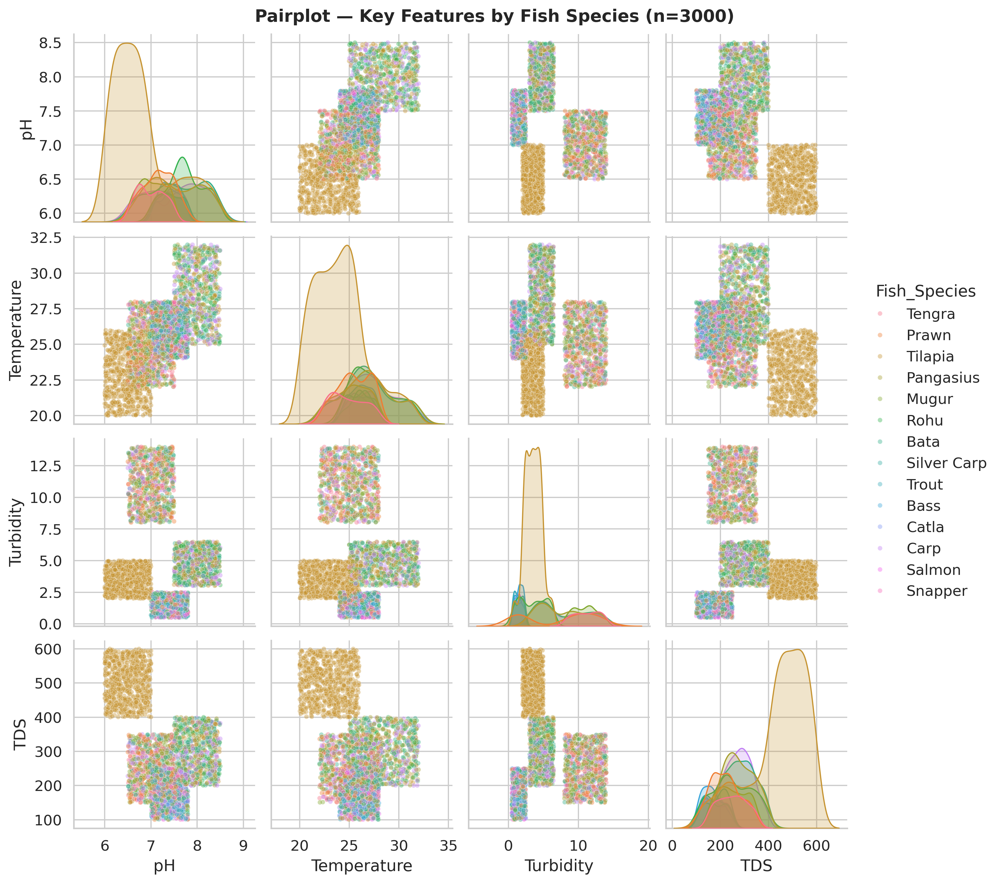

✅ CELL 20 DONE: Pairplot saved @ 300 DPI


In [20]:
# ============================================================
# CELL 20 — EDA: PAIRPLOT  [Graph 10 | EDA 14]
# ============================================================
print("⏳ Generating Pairplot (n=3000)...")

# EDA method 14 — df.sample()
sample_df = df.sample(n=3000, random_state=42)
pairplot_features = ['pH', 'Temperature', 'Turbidity', 'TDS', 'Fish_Species']

# graph method 10 — sns.pairplot()
g = sns.pairplot(sample_df[pairplot_features], hue='Fish_Species',
                 palette='husl',
                 plot_kws={'alpha': 0.4, 's': 15},
                 diag_kind='kde')
g.figure.suptitle("Pairplot — Key Features by Fish Species (n=3000)",
                  y=1.01, fontsize=14, fontweight='bold')
plt.savefig("plots/13_pairplot.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 20 DONE: Pairplot saved @ 300 DPI")

In [ ]:
# ============================================================
# CELL 21 — TRAIN-TEST SPLIT  [Model method 1]
# ============================================================
# Model method 1 — train_test_split()

)
print("✅ CELL 21 DONE: Train-Test Split")
print(f"   📌 X_train : {X_train.shape}")
print(f"   📌 X_test  : {X_test.shape}")

✅ CELL 21 DONE: Train-Test Split
   📌 X_train : (367024, 27)
   📌 X_test  : (91756, 27)


In [ ]:
# ============================================================
# CELL 22 — MODEL: LIGHTGBM (Tuned)  [Model methods 3,4,5,6]
# ============================================================
print("⏳ Training LightGBM (Tuned)...")

# Model method 3 — Classifier()
lgbm_model = (
   
)

# Model method 4 — .fit()
lgbm_model.fit(
    X_train, y_train,
    eval_set=[(X_test, y_test)],
    callbacks=[
        lgb.early_stopping(stopping_rounds=50, verbose=False),
        lgb.log_evaluation(period=0)
    ]
)

# Model method 5 — .predict()
y_pred_lgbm = lgbm_model.predict(X_test)
# Model method 6 — .predict_proba()
prob_lgbm   = lgbm_model.predict_proba(X_test)

# Model method 7 — accuracy_score()
acc_lgbm = accuracy_score(y_test, y_pred_lgbm)

# Model method 8 — precision_score()
# Model method 9 — recall_score()
# Model method 10 — f1_score()
prec_lgbm = precision_score(y_test, y_pred_lgbm, average='weighted')
rec_lgbm  = recall_score(y_test, y_pred_lgbm,    average='weighted')
f1_lgbm   = f1_score(y_test, y_pred_lgbm,        average='weighted')

print(f"✅ CELL 22 DONE: LightGBM Training Complete")
print(f"   🎯 Accuracy  : {acc_lgbm*100:.2f}%")
print(f"   🎯 Precision : {prec_lgbm:.4f}")
print(f"   🎯 Recall    : {rec_lgbm:.4f}")
print(f"   🎯 F1-Score  : {f1_lgbm:.4f}")

⏳ Training LightGBM (Tuned)...
✅ CELL 22 DONE: LightGBM Training Complete
   🎯 Accuracy  : 92.38%
   🎯 Precision : 0.9242
   🎯 Recall    : 0.9238
   🎯 F1-Score  : 0.9230


In [23]:
# ============================================================
# CELL 23 — FULL CLASSIFICATION REPORT  [Model method 11 | Saving 3,8]
# ============================================================
# Model method 11 — classification_report()
report = classification_report(
    y_test, y_pred_lgbm,
    target_names=label_encoder_fish.classes_,
    output_dict=True
)

# Saving method 2 — pd.DataFrame()  |  method 8 — .transpose()
report_df = pd.DataFrame(report).transpose()

# Saving method 3 — .to_csv()
report_df.to_csv("results/01_classification_report.csv")

print("✅ CELL 23 DONE: Classification Report")
print(f"\n🎯 Final Accuracy  : {acc_lgbm*100:.2f}%")
print(f"🎯 Final Precision : {prec_lgbm:.4f}")
print(f"🎯 Final Recall    : {rec_lgbm:.4f}")
print(f"🎯 Final F1-Score  : {f1_lgbm:.4f}")
print("\n📊 Full Classification Report:")
print(classification_report(y_test, y_pred_lgbm,
                             target_names=label_encoder_fish.classes_))

✅ CELL 23 DONE: Classification Report

🎯 Final Accuracy  : 92.38%
🎯 Final Precision : 0.9242
🎯 Final Recall    : 0.9238
🎯 Final F1-Score  : 0.9230

📊 Full Classification Report:
              precision    recall  f1-score   support

        Bass       0.96      0.98      0.97      6554
        Bata       0.86      0.85      0.86      6554
        Carp       0.86      0.85      0.86      6554
       Catla       0.96      0.98      0.97      6554
       Mugur       0.92      0.98      0.95      6554
   Pangasius       0.86      0.85      0.85      6554
       Prawn       0.92      0.90      0.91      6554
        Rohu       0.86      0.88      0.87      6554
      Salmon       0.96      0.98      0.97      6554
 Silver Carp       0.96      0.98      0.97      6554
     Snapper       0.96      0.98      0.97      6554
      Tengra       0.92      0.98      0.95      6554
     Tilapia       0.98      0.78      0.87      6554
       Trout       0.96      0.98      0.97      6554

    accura

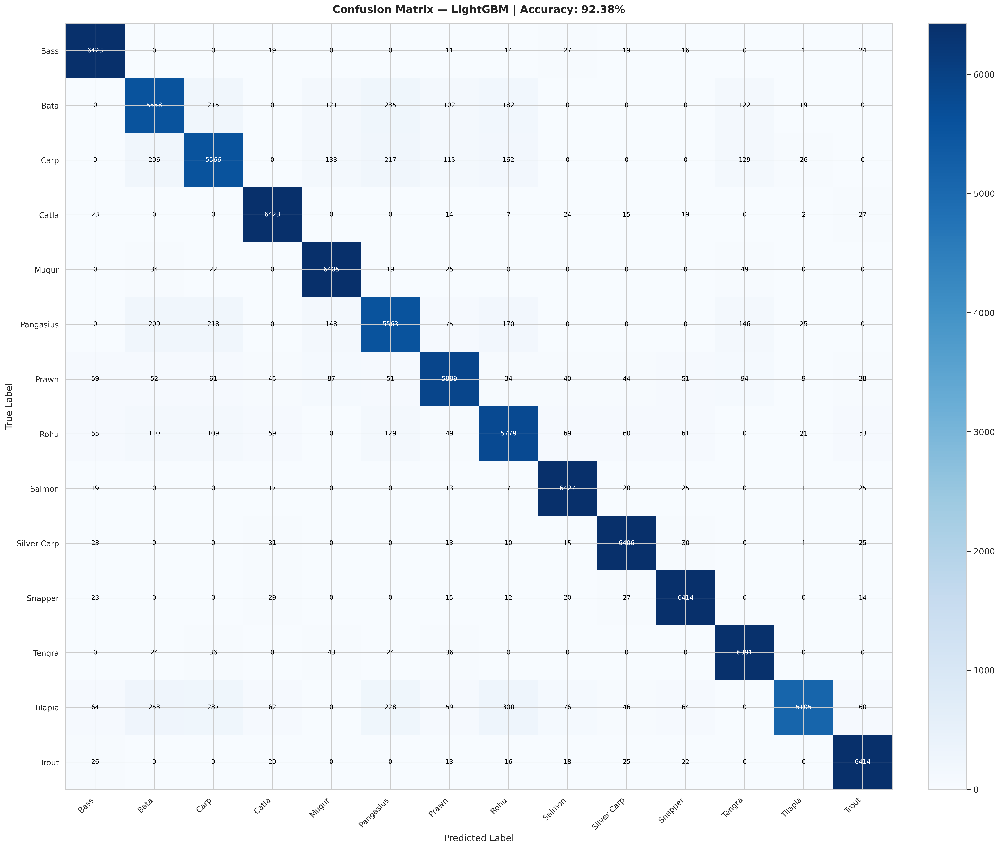

✅ CELL 24 DONE: Confusion Matrix saved @ 300 DPI


In [24]:
# ============================================================
# CELL 24 — CONFUSION MATRIX  [Graph 13 | Model method 12]
# ============================================================
# Model method 12 — confusion_matrix()
cm = confusion_matrix(y_test, y_pred_lgbm)

fig, ax = plt.subplots(figsize=(20, 17))
im = ax.imshow(cm, cmap='Blues', aspect='auto')
plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha='center', va='center', fontsize=9,
                color='white' if cm[i, j] > thresh else 'black')

ax.set_xticks(np.arange(len(label_encoder_fish.classes_)))
ax.set_yticks(np.arange(len(label_encoder_fish.classes_)))
ax.set_xticklabels(label_encoder_fish.classes_, rotation=45, ha='right', fontsize=11)
ax.set_yticklabels(label_encoder_fish.classes_, fontsize=11)
ax.set_title(f"Confusion Matrix — LightGBM | Accuracy: {acc_lgbm*100:.2f}%",
             fontsize=15, fontweight='bold', pad=15)
ax.set_xlabel("Predicted Label", fontsize=13)
ax.set_ylabel("True Label", fontsize=13)
plt.tight_layout()
plt.savefig("plots/14_confusion_matrix.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 24 DONE: Confusion Matrix saved @ 300 DPI")

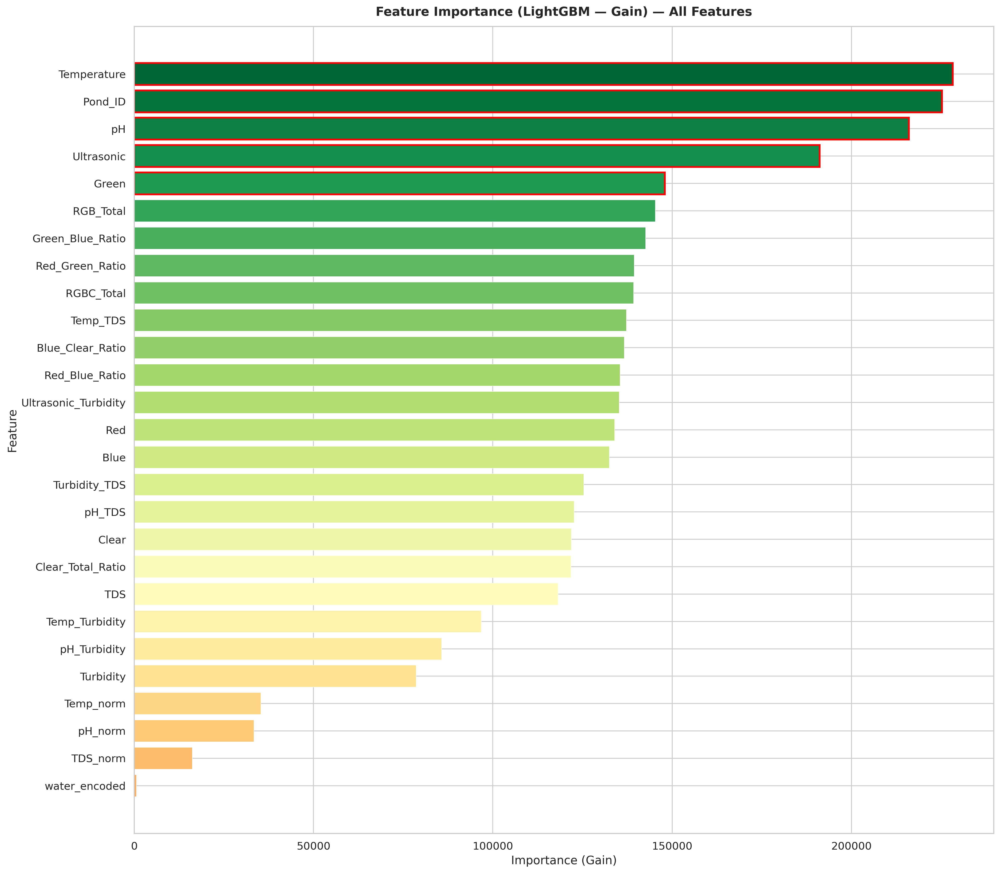

✅ CELL 25 DONE: Feature Importance saved @ 300 DPI

🔝 Top 10 Features:
         Feature  Importance
     Temperature      228257
         Pond_ID      225244
              pH      216020
      Ultrasonic      191161
           Green      147954
       RGB_Total      145299
Green_Blue_Ratio      142614
 Red_Green_Ratio      139437
      RGBC_Total      139259
        Temp_TDS      137247


In [25]:
# ============================================================
# CELL 25 — FEATURE IMPORTANCE  [Graph 13]
# ============================================================
importance_df = pd.DataFrame({
    'Feature':    feature_columns,
    'Importance': lgbm_model.feature_importances_
# EDA method 16 — .sort_values()
}).sort_values('Importance', ascending=True)

# Save feature importance CSV
importance_df.sort_values('Importance', ascending=False).to_csv(
    "results/02_feature_importance.csv", index=False
)

# graph method 13 — plt.barh()
plt.figure(figsize=(16, 14))
colors_imp = plt.cm.RdYlGn(np.linspace(0.3, 1.0, len(importance_df)))
bars = plt.barh(importance_df['Feature'], importance_df['Importance'],
                color=colors_imp, edgecolor='white', linewidth=0.5)
plt.title("Feature Importance (LightGBM — Gain) — All Features",
          fontsize=14, fontweight='bold', pad=12)
plt.xlabel("Importance (Gain)"); plt.ylabel("Feature")

top5 = importance_df.tail(5)['Feature'].tolist()
for bar, feat in zip(bars, importance_df['Feature']):
    if feat in top5:
        bar.set_edgecolor('red'); bar.set_linewidth(2)

plt.tight_layout()
plt.savefig("plots/15_feature_importance.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 25 DONE: Feature Importance saved @ 300 DPI")
print("\n🔝 Top 10 Features:")
print(importance_df.tail(10)[['Feature','Importance']].iloc[::-1].to_string(index=False))

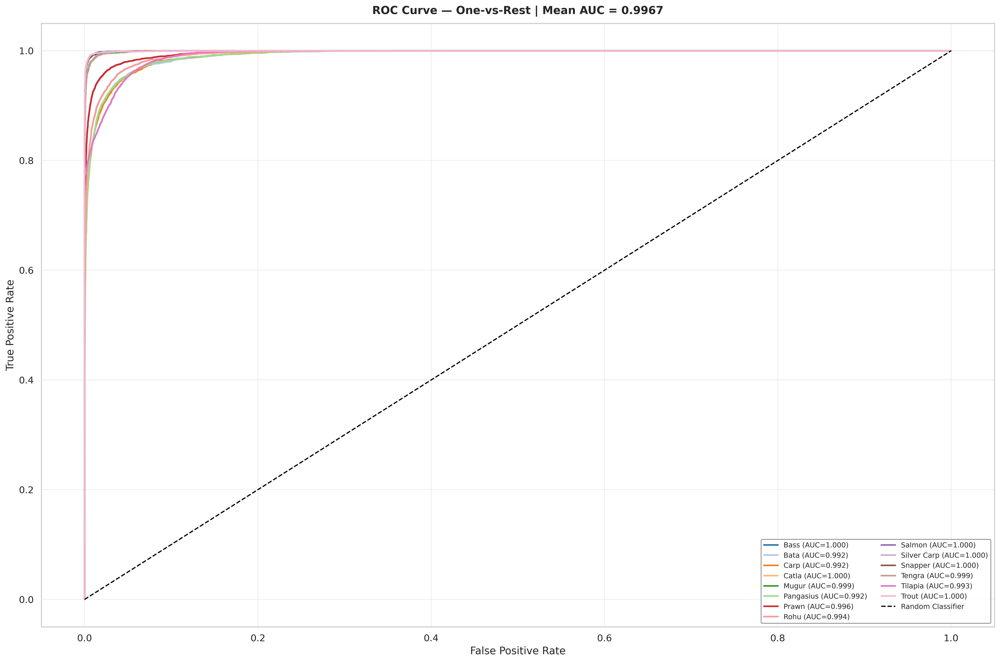

✅ CELL 26 DONE: ROC Curve saved @ 300 DPI | Mean AUC = 0.9967


In [26]:
# ============================================================
# CELL 26 — ROC CURVE (One-vs-Rest)  [Graph 12 | ROC methods 1,2]
# ============================================================
colors_roc = plt.cm.tab20.colors
auc_scores = []

plt.figure(figsize=(18, 12))
for i in range(len(label_encoder_fish.classes_)):
    y_bin   = (y_test == i).astype(int)
    y_score = prob_lgbm[:, i]
    # ROC method 1 — roc_curve()
    fpr, tpr, _ = roc_curve(y_bin, y_score)
    # ROC method 2 — auc()
    roc_auc = auc(fpr, tpr)
    auc_scores.append(roc_auc)
    # graph method 12 — plt.plot()
    plt.plot(fpr, tpr, color=colors_roc[i], linewidth=2,
             label=f'{label_encoder_fish.classes_[i]} (AUC={roc_auc:.3f})')

plt.plot([0,1],[0,1],'k--', linewidth=1.5, label='Random Classifier')
# ROC method 4 — np.mean()
mean_auc = np.mean(auc_scores)
plt.title(f"ROC Curve — One-vs-Rest | Mean AUC = {mean_auc:.4f}",
          fontsize=14, fontweight='bold', pad=12)
plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
plt.legend(loc='lower right', fontsize=9, ncol=2,
           framealpha=0.9, edgecolor='gray')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("plots/16_roc_curve.png", dpi=DPI, bbox_inches='tight')
plt.show()

# Save ROC-AUC scores CSV
roc_auc_df = pd.DataFrame({
    'Fish_Species': label_encoder_fish.classes_,
    'AUC_Score':    auc_scores
})
roc_auc_df.loc[len(roc_auc_df)] = ['Mean AUC', mean_auc]
roc_auc_df.to_csv("results/03_roc_auc_scores.csv", index=False)

print(f"✅ CELL 26 DONE: ROC Curve saved @ 300 DPI | Mean AUC = {mean_auc:.4f}")

In [ ]:
# ============================================================
# CELL 27 — PRECISION-RECALL CURVE  [Graph 12 | ROC method 3]
# ============================================================
pr_auc_scores = []

plt.figure(figsize=(18, 12))
for i in range(len(label_encoder_fish.classes_)):
    y_bin   = (y_test == i).astype(int)
    y_score = prob_lgbm[:, i]
    # ROC method 3 — precision_recall_curve()
    prec, rec, _ = precision_recall_curve(y_bin, y_score)
    pr_auc = auc(rec, prec)
    pr_auc_scores.append(pr_auc)
    plt.plot(rec, prec, color=colors_roc[i], linewidth=2,
             label=f'{label_encoder_fish.classes_[i]} (AUC={pr_auc:.3f})')

plt.title("Precision-Recall Curve — One-vs-Rest",
          fontsize=14, fontweight='bold', pad=12)
plt.xlabel("Recall"); plt.ylabel("Precision")
plt.legend(loc='lower left', fontsize=9, ncol=2, framealpha=0.9)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("plots/17_precision_recall_curve.png", dpi=DPI, bbox_inches='tight')
plt.show()

# Save PR-AUC scores CSV
mean_pr_auc = np.mean(pr_auc_scores)
pr_auc_df = pd.DataFrame({
    'Fish_Species': label_encoder_fish.classes_,
    'PR_AUC_Score': pr_auc_scores
})
pr_auc_df.loc[len(pr_auc_df)] = ['Mean PR-AUC', mean_pr_auc]
pr_auc_df.to_csv("results/04_pr_auc_scores.csv", index=False)

print(f"✅ CELL 27 DONE: PR Curve saved @ 300 DPI | Mean PR-AUC = {mean_pr_auc:.4f}")

In [ ]:
# ============================================================
# CELL 28 — PRECISION / RECALL / F1 vs THRESHOLD
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(26, 9))
titles = ['Precision vs Threshold', 'Recall vs Threshold', 'F1-Score vs Threshold']

for i in range(len(label_encoder_fish.classes_)):
    y_bin   = (y_test == i).astype(int)
    y_score = prob_lgbm[:, i]
    prec, rec, thresh = precision_recall_curve(y_bin, y_score)
    f1s = 2*(prec[:-1]*rec[:-1]) / (prec[:-1]+rec[:-1]+1e-10)

    axes[0].plot(thresh, prec[:-1], color=colors_roc[i], linewidth=1.5,
                 label=label_encoder_fish.classes_[i])
    axes[1].plot(thresh, rec[:-1],  color=colors_roc[i], linewidth=1.5)
    axes[2].plot(thresh, f1s,       color=colors_roc[i], linewidth=1.5)

for ax, title in zip(axes, titles):
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_xlabel("Threshold"); ax.grid(True, alpha=0.3)

axes[0].set_ylabel("Precision")
axes[1].set_ylabel("Recall")
axes[2].set_ylabel("F1-Score")
axes[0].legend(fontsize=7, ncol=2, loc='lower left')

plt.suptitle("Precision | Recall | F1-Score vs Decision Threshold (One-vs-Rest)",
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("plots/18_threshold_curves.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 28 DONE: Threshold Curves saved @ 300 DPI")

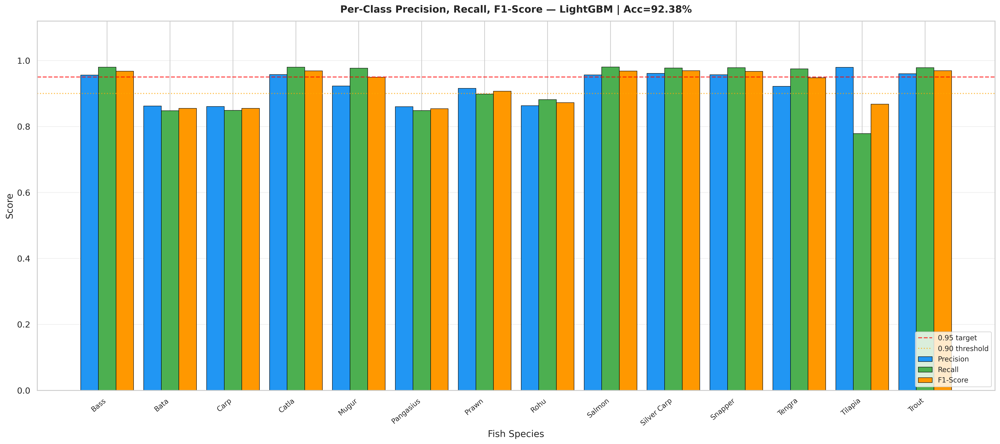

✅ CELL 29 DONE: Per-Class Metrics saved @ 300 DPI


In [ ]:
# ============================================================
# CELL 29 — PER-CLASS METRICS BAR CHART
# ============================================================
metrics_df = report_df.drop(['accuracy', 'macro avg', 'weighted avg'], errors='ignore')
metrics_df = metrics_df[['precision', 'recall', 'f1-score']].copy()

# Save per-class metrics CSV

ax.set_xlabel("Fish Species"); ax.set_ylabel("Score")
ax.set_xticks(x_pos)
ax.set_xticklabels(metrics_df.index, rotation=40, ha='right', fontsize=10)
ax.set_ylim(0, 1.12)
ax.axhline(y=0.95, color='red',    linestyle='--', linewidth=1.5,
           label='0.95 target', alpha=0.7)
ax.axhline(y=0.90, color='orange', linestyle=':',  linewidth=1.5,
           label='0.90 threshold', alpha=0.7)
ax.legend(loc='lower right', fontsize=10)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig("plots/19_per_class_metrics.png", dpi=DPI, bbox_inches='tight')
plt.show()
print("✅ CELL 29 DONE: Per-Class Metrics saved @ 300 DPI")

In [ ]:
# ============================================================
# CELL 30 — SAVE ALL MODELS & ARTIFACTS  [Saving methods 4,6]
# ============================================================
# Saving method 4 — joblib.dump()
joblib.dump(lgbm_model,           "models/lgbm_fish_model.pkl")
joblib.dump(scaler,               "models/scaler.pkl")
joblib.dump(label_encoder_fish,   "models/label_encoder_fish.pkl")
joblib.dump(label_encoder_water,  "models/label_encoder_water.pkl")
joblib.dump(feature_columns,      "models/feature_columns.pkl")

print("✅ CELL 30 DONE: All models & artifacts saved")
print("   📁 models/lgbm_fish_model.pkl")
print("   📁 models/scaler.pkl")
print("   📁 models/label_encoder_fish.pkl")
print("   📁 models/label_encoder_water.pkl")
print("   📁 models/feature_columns.pkl")

In [ ]:
# ============================================================
# CELL 31 — FINAL SUMMARY CSV  [Saving method 3,6,7]
# ============================================================


summary_df = pd.DataFrame(summary_data)
# Saving method 3 — .to_csv()
summary_df.to_csv("results/06_final_summary.csv", index=False)

# Saving method 7 — print()
print("\n" + "=" * 70)
print("🎉 FINAL SUMMARY — LIGHTGBM FISH CLASSIFICATION PIPELINE")
print("=" * 70)
print(f"\n📊 Dataset           : 10 Ponds | 4 Water Types | 14 Fish Species")
print(f"📊 Total Samples     : {len(df):,}")
print(f"📊 Features (Total)  : {len(feature_columns)}")
print(f"   ↳ Original        : {len(base_num_cols)} sensor features")
print(f"   ↳ Engineered      : {len(engineered_cols)} (ratios, interactions)")
print(f"   ↳ Categorical     : 2 (water_encoded, Pond_ID)")
print(f"📊 After SMOTE       : {X_resampled.shape[0]:,} samples")
print(f"📊 Train / Test      : {X_train.shape[0]:,} / {X_test.shape[0]:,}")
print(f"{'─'*70}")
print(f"🏆 Model             : LightGBM (Tuned)")
print(f"🎯 Accuracy          : {acc_lgbm*100:.2f}%")
print(f"🎯 Precision (W)     : {prec_lgbm:.4f}")
print(f"🎯 Recall    (W)     : {rec_lgbm:.4f}")
print(f"🎯 F1-Score  (W)     : {f1_lgbm:.4f}")
print(f"🎯 Mean AUC  (ROC)   : {mean_auc:.4f}")
print(f"🎯 Mean AUC  (PR)    : {mean_pr_auc:.4f}")
print(f"{'─'*70}")
print(f"📁 Plots Saved       : {len(os.listdir('plots'))} PNG files @ {DPI} DPI")
print(f"📁 PKL Files         : 5  (model + scaler + 2 encoders + feature_cols)")
print(f"📁 CSV Files         : 6  (report, importance, ROC-AUC, PR-AUC, per-class, summary)")
print("\n✅ ALL DONE — LIGHTGBM PIPELINE COMPLETE! ✅")
print("=" * 70)


🎉 FINAL SUMMARY — LIGHTGBM FISH CLASSIFICATION PIPELINE

📊 Dataset           : 10 Ponds | 4 Water Types | 14 Fish Species
📊 Total Samples     : 100,000
📊 Features (Total)  : 27
   ↳ Original        : 9 sensor features
   ↳ Engineered      : 16 (ratios, interactions)
   ↳ Categorical     : 2 (water_encoded, Pond_ID)
📊 After SMOTE       : 458,780 samples
📊 Train / Test      : 367,024 / 91,756
──────────────────────────────────────────────────────────────────────
🏆 Model             : LightGBM (Tuned)
🎯 Accuracy          : 92.38%
🎯 Precision (W)     : 0.9242
🎯 Recall    (W)     : 0.9238
🎯 F1-Score  (W)     : 0.9230
🎯 Mean AUC  (ROC)   : 0.9967
🎯 Mean AUC  (PR)    : 0.9724
──────────────────────────────────────────────────────────────────────
📁 Plots Saved       : 22 PNG files @ 300 DPI
📁 PKL Files         : 5  (model + scaler + 2 encoders + feature_cols)
📁 CSV Files         : 6  (report, importance, ROC-AUC, PR-AUC, per-class, summary)

✅ ALL DONE — LIGHTGBM PIPELINE COMPLETE! ✅
